In [54]:
# Libraries
import pandas as pd, seaborn as sns, pingouin as pg, matplotlib.pyplot as plt, plotly.express as px, numpy as np, re, ipywidgets as widgets
from sklearn.preprocessing import OneHotEncoder

# Credit Risk Analysis - Exloratory analysis<br>

The objective of this analysis is to understand which are the factors that are more effecting the probability of having an high credit risk of a given company, using initially only the data of the explanatory variables of 2019 to predict the credit risk of 2020 (true values vs forecasts). <br>
Then it can be added new explanatory variables 'delayed' e.g. leverage to 2018, 2017, etc. <br>
In this specific notebook the modified dataset will be imported and some very easy (but helpfull) exploratory analysis will be done.

**Financial Data Science (UniPV) - Prof. Paolo Giudici** <br>
*Computer Engineering (Data Science) - A.Y. 2022/23* <br>
*Francesco Amato, 507767*

### Import the dataset

In [55]:
# Load the datatset
companies_df = pd.read_csv('../dataset/cleaned-credit-risk.tar.gz', compression='gzip')
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,ROE.2018,ROE.2017,ROE.2016,ROE.2015,TAsset.2020,TAsset.2019,TAsset.2018,TAsset.2017,TAsset.2016,TAsset.2015
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,8.24,-146.65,60.76,-471.72,49263,28268,15455,15992,13597.0,11659.0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,61.42,-55.57,-127.29,-87.13,16550,16887,16468,10773,6697.0,8933.0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,57.52,42.73,20.34,44.62,13500,9620,7371,5432,4170.0,2862.0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,-17.24,0.71,2.89,6.45,24978,25032,25729,21632,25403.0,24941.0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,-5.17,-6.74,0.03,-8.19,36823,34659,36205,38423,41847.0,41323.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,11.01,8.44,7.83,6.31,15935,15664,14438,13054,12243.0,11695.0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,0.62,-4.80,-7.85,-12.84,2487,2317,2351,2521,2797.0,3152.0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,1.88,3.10,2.90,5.62,2547,1855,1692,1843,1773.0,1699.0
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,3.74,3.54,18.85,0.58,2961,2552,2604,2474,1546.0,1222.0


### Visualize companies by coordinates
#### Add to each row (representing a different company) the coordinate of the city

The objective is to obtain a graph that displays where the companies are located.<br>
Please **note** that since we do not have the precise address of the company we can just show an approximate location (a gaussian noise has been added to avoid that multiple companies overlap in the same exact geographical location).

In [56]:
countries_df = pd.read_csv('../dataset/countries.tar.gz', compression='gzip')[['name', 'alpha-2']]
cities_df = pd.read_csv('../dataset/world-cities.tar.gz', low_memory=False, compression='gzip')[['City', 'Country', 'Latitude', 'Longitude']]

In [57]:
countries_df['alpha-2'] = countries_df['alpha-2'].str.lower()
countries_df = countries_df.rename(columns={'name':'Country'})
countries_df

,Country,alpha-2
0,Afghanistan,af
1,Åland Islands,ax
2,Albania,al
3,Algeria,dz
4,American Samoa,as
...,...,...
244,Wallis and Futuna,wf
245,Western Sahara,eh
246,Yemen,ye
247,Zambia,zm


In [58]:
cities_df['City'] = cities_df['City'].str.capitalize()
cities_df = cities_df.rename(columns={'Country':'alpha-2'})
cities_df

,City,alpha-2,Latitude,Longitude
0,Aixas,ad,42.483333,1.466667
1,Aixirivali,ad,42.466667,1.500000
2,Aixirivall,ad,42.466667,1.500000
3,Aixirvall,ad,42.466667,1.500000
4,Aixovall,ad,42.466667,1.483333
...,...,...,...,...
3173953,Zimre park,zw,-17.866111,31.213611
3173954,Ziyakamanas,zw,-18.216667,27.950000
3173955,Zizalisari,zw,-17.758889,31.010556
3173956,Zuzumba,zw,-20.033333,27.933333


In [59]:
companies_locations_df = companies_df[['Company name', 'Region', 'Country']].merge(countries_df, on='Country')
companies_locations_df = companies_locations_df.rename(columns={'Region':'City'})
companies_locations_df = companies_locations_df .merge(cities_df, on=['City', 'alpha-2'])

In [60]:
# Add gaussian noise to locs (! location is 100% precise, but this is not our purpose !)
companies_locations_df['Latitude'] += np.random.normal(0, 0.04, len(companies_locations_df))
companies_locations_df['Longitude'] += np.random.normal(0, 0.04, len(companies_locations_df))

In [61]:
fig = px.density_mapbox(companies_locations_df, lat='Latitude', lon='Longitude', radius=1.2, center=dict(lat=46.2, lon=8.2), zoom=3, mapbox_style='open-street-map', hover_name='Company name')
fig.show()

### Details of companies for each country
#### Percentage of companies for each country

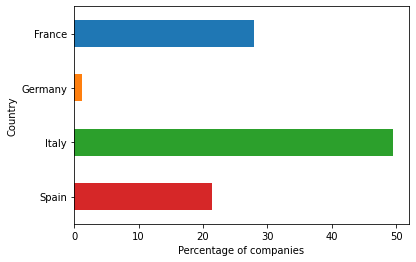

In [62]:
(companies_df.groupby('Country').size() / len(companies_df) * 100).plot(kind='barh', color=list(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])).invert_yaxis()
plt.xlabel('Percentage of companies');

The number of companies that we have for each country is not balanced, so we should take into account this fact.

#### Percentage of companies for each country, for each credit risk level (select the year through the slider)

In [63]:
year_widget = widgets.IntSlider(value=2020, min=2015, max=2020, description='Year:', disabled=False, continuous_update=True, orientation='horizontal', readout=True, readout_format='d')
year_widget

IntSlider(value=2020, description='Year:', max=2020, min=2015)

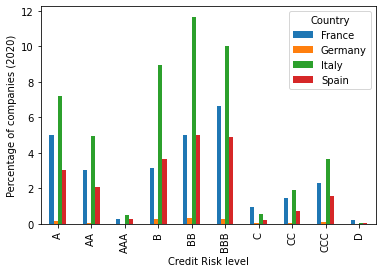

In [64]:
(companies_df.groupby(['MScore.'+str(year_widget.value), 'Country']).size() / len(companies_df) * 100).unstack().plot.bar()
plt.xlabel('Credit Risk level')
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')');

##### Casting MScore of the different years into integer values

In [65]:
# Function that takes a MScore and cast it into an integer value (0 means a low credit risk, 1 an high credit risk)
def MScore_to_int(x):
    return 0 if (x[0].lower() == ('a' or 'b')) else 1

for col in [c for c in companies_df.columns if c.startswith('MScore.')]:
    companies_df[str(col)+'.int'] = companies_df[str(col)].apply(lambda x: MScore_to_int(x))

#### Percentage of companies - with low and high credit risk - for each country (in an year)

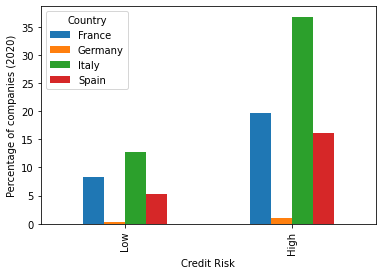

In [66]:
(companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Country']).size() / len(companies_df) * 100).unstack().plot.bar()
plt.xlabel('Credit Risk')
plt.xticks([0,1], ['Low', 'High'])
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')');

By the graph illustrated before we can see that we have more companies belonging into the high credit risk than in low credit risk level. Should this be even what happens in reality? It makes sense, especially since we are considering year 2020 - when pandemic effect due to Covid leds closing lot of companies (lets check this aspect).

### Did Covid-19 led an increase in the number of high credit risk companies (considering the ones whe have)?

In [67]:
for year in range(2015, 2021):
    print(' High credit risk level companies in ' + str(year) + ': ' + str(companies_df['MScore.'+str(year)+'.int'].value_counts()[1]))

 High credit risk level companies in 2015: 94637
 High credit risk level companies in 2016: 92232
 High credit risk level companies in 2017: 90031
 High credit risk level companies in 2018: 89059
 High credit risk level companies in 2019: 88317
 High credit risk level companies in 2020: 88930


Our hypothesis is not true, why? Maybe the majority of the companies are working in a sector that has not been effected by the Covid (or that Covid helped?) <br> Remember that **correlation is not causation!**<br><br>
This aspect seems a bit strange, anyway it might need to be studied in more details.

In [68]:
(companies_df['Sector 2'].value_counts() / len(companies_df) * 100).to_frame()

,Sector 2
Retailing,24.923146
Capital Goods,14.461854
Materials,9.881991
Commercial and professional services,8.953953
Food and Staples Retailing,7.297038
Transportation,6.339250
Food Beverage and Tobacco,5.879777
Consumer Durables and Apparel,3.950978
Consumer Services,2.948565
Automobiles and Components,2.735356


### Percentage of companies - for each credit risk level - for each country and city (in an year)

In [69]:
(companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Country', 'Region']).size() / len(companies_df) * 100).unstack()

Region                   Agrigento  Ahrweiler  Aichach-Friedberg       Ain  \
MScore.2020.int Country                                                      
0               France         NaN        NaN                NaN  0.105778   
                Germany        NaN        NaN                NaN       NaN   
                Italy     0.017354        NaN                NaN       NaN   
                Spain          NaN        NaN                NaN       NaN   
1               France         NaN        NaN                NaN  0.186765   
                Germany        NaN   0.000826           0.003306       NaN   
                Italy     0.059500        NaN                NaN       NaN   
                Spain          NaN        NaN                NaN       NaN   

Region                      Aisne     Alava  Alb-Donau  Albacete  Alessandria  \
MScore.2020.int Country                                                         
0               France   0.058674       NaN        NaN       NaN          NaN   
                Germany       NaN       NaN        NaN       NaN          NaN   
                Italy         NaN       NaN        NaN       NaN     0.081813   
                Spain         NaN  0.061153        NaN  0.049583          NaN   
1               France   0.116521       NaN        NaN       NaN          NaN   
                Germany       NaN       NaN   0.000826       NaN          NaN   
                Italy         NaN       NaN        NaN       NaN     0.244612   
                Spain         NaN  0.176848        NaN  0.132223          NaN   

Region                   Alicante  ...  Wuerzburg, Landkreis  Wunsiedel  \
MScore.2020.int Country            ...                                    
0               France        NaN  ...                   NaN        NaN   
                Germany       NaN  ...                   NaN        NaN   
                Italy         NaN  ...                   NaN        NaN   
                Spain    0.162799  ...                   NaN        NaN   
1               France        NaN  ...                   NaN        NaN   
                Germany       NaN  ...              0.000826   0.002479   
                Italy         NaN  ...                   NaN        NaN   
                Spain    0.452036  ...                   NaN        NaN   

Region                   Wuppertal     Yonne  Yvelines    Zamora  Zaragoza  \
MScore.2020.int Country                                                      
0               France         NaN  0.047931  0.156188       NaN       NaN   
                Germany   0.001653       NaN       NaN       NaN       NaN   
                Italy          NaN       NaN       NaN       NaN       NaN   
                Spain          NaN       NaN       NaN  0.013222  0.175195   
1               France         NaN  0.065285  0.345432       NaN       NaN   
                Germany   0.002479       NaN       NaN       NaN       NaN   
                Italy          NaN       NaN       NaN       NaN       NaN   
                Spain          NaN       NaN       NaN  0.041320  0.483439   

Region                   Zollernalbkreis  Zweibruecken   Zwickau  
MScore.2020.int Country                                           
0               France               NaN           NaN       NaN  
                Germany              NaN           NaN       NaN  
                Italy                NaN           NaN       NaN  
                Spain                NaN           NaN       NaN  
1               France               NaN           NaN       NaN  
                Germany         0.000826      0.000826  0.004958  
                Italy                NaN           NaN       NaN  
                Spain                NaN           NaN       NaN  

[8 rows x 584 columns]

### One-hot encoding of countries

In [70]:
encoder = OneHotEncoder()
encoder.fit(companies_df[['Country']])
encoder_df = pd.DataFrame(encoder.fit_transform(companies_df[['Country']]).toarray())
encoder_df.columns = [i[3:] for i in encoder.get_feature_names().tolist()]
companies_df = companies_df.join(encoder_df.iloc[:, -4:].apply(pd.to_numeric, downcast='integer'))
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,MScore.2020.int,MScore.2019.int,MScore.2018.int,MScore.2017.int,MScore.2016.int,MScore.2015.int,France,Germany,Italy,Spain
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,1,1,1,1,1,1,0,0,1,0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,0,1,1,1,1,1,0,0,1,0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,1,1,1,1,1,1,0,0,1,0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,1,1,1,1,1,1,1,0,0,0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,1,1,1,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,0,0,0,0,0,0,0,0,1,0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,1,1,1,1,1,1,0,0,1,0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,0,0,0,1,1,0,0,0,0,1
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,1,1,1,1,1,1,0,0,1,0


### NACE groups vs Credit risk levels (in an year)

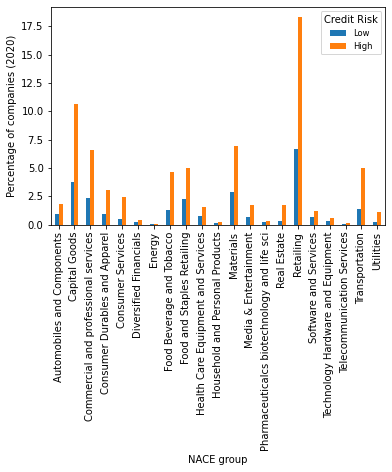

In [71]:
(companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Sector 2']).agg(Companies=('Company name', 'count')).unstack('MScore.'+str(year_widget.value)+'.int') / len(companies_df) * 100).plot.bar();
plt.xlabel('NACE group')
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')');
plt.legend(['Low', 'High'], title='Credit Risk',fontsize='small', fancybox=True);

### Is it possible that after a company gets D credit risk level in an year and the consequent one still gets a D?

This check has been applied in order to understand whether the MScore represents a default or a credit risk level (they are not perfectly metching). Otherwise a company with level D should be closed in the consequent year/s.

In [72]:
year_widget = widgets.IntSlider(value=2019, min=2015, max=2019, description='Year:', disabled=False, continuous_update=True, orientation='horizontal', readout=True, readout_format='d')
year_widget

IntSlider(value=2019, description='Year:', max=2019, min=2015)

In [73]:
test_df = companies_df[companies_df['MScore.'+str(year_widget.value)] == companies_df['MScore.'+str(year_widget.value+1)]][['Company name', 'MScore.'+str(year_widget.value),  'MScore.'+str(year_widget.value+1)]]
n = test_df[test_df['MScore.'+str(year_widget.value)] == 'D'].count()[0]
print(str(n) + ' companies had a D credit risk level in ' + str(year_widget.value) + ' and the consequent year')

153 companies had a D credit risk level in 2019 and the consequent year


### Correlations and partial correlations

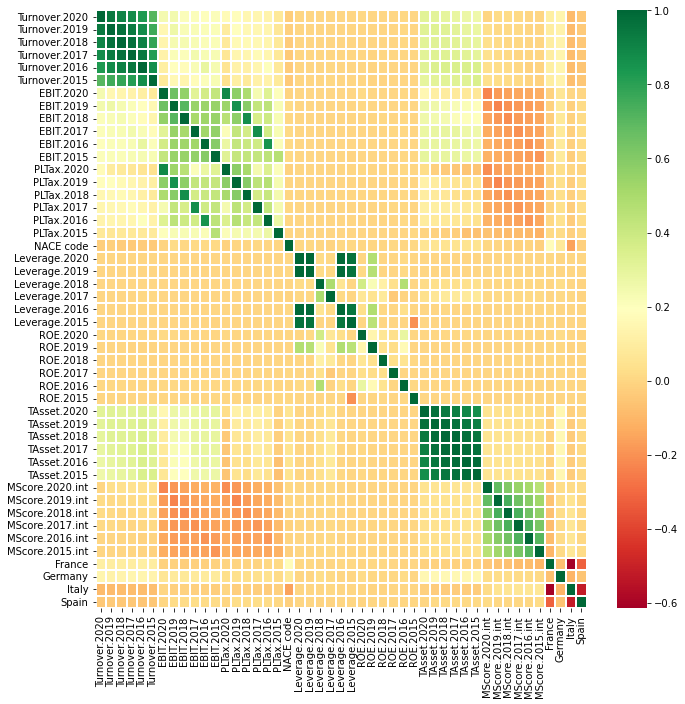

In [74]:
# Pearson correlation
plt.figure(figsize=(11, 11))
sns.heatmap(companies_df.corr(), cmap='RdYlGn', linewidths = 0.1);

Always recall of the presence of spurious correlations

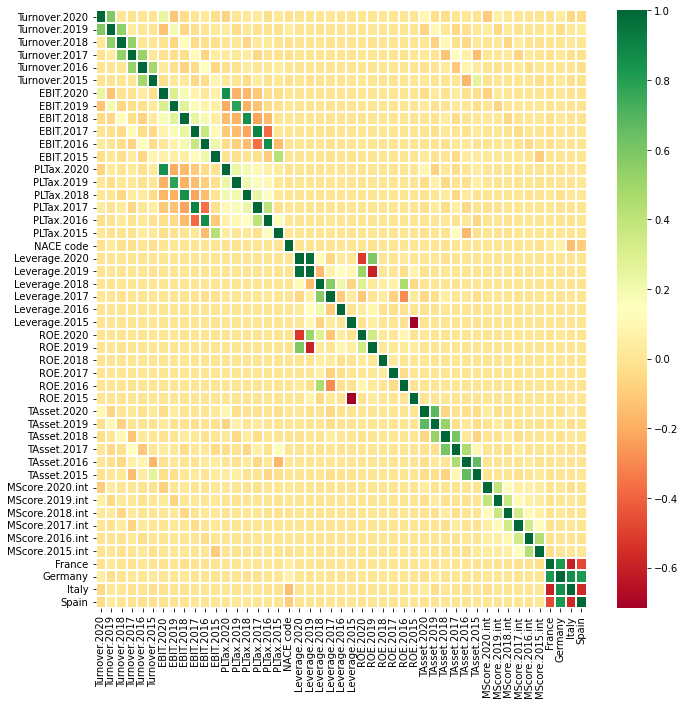

In [75]:
# Partial correlations
plt.figure(figsize=(11, 11))
sns.heatmap(pg.pcorr(companies_df), cmap='RdYlGn', linewidths = 0.1);

Since our target variable is the MScore (in an year), basically we want to consider which are the variables that are more impacting the response varible (without taking into account possible spurious correlations with the features we are considering). <br>
It is clear that the MScore in an year is positively correlated with previous years MScores (the correlation strength reduces with years). It basically means that if a company has an high credit risk level in an year it is highly possible that the same will happen in the following year (and also - but with less strength effect - also in the consequent ones). <br>Furthermore if we have the Turnover and the EBIT features in the same year, negative values of those two will cause an increase in the credit risk level.